<a href="https://colab.research.google.com/github/Maffert/challenge-data-science/blob/main/AluraStoreLatam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importación de datos



In [3]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()


,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



Facturación Total de Tiendas

In [16]:
fact_t1 = tienda["Precio"].sum()
fact_t2 = tienda2["Precio"].sum()
fact_t3 = tienda3["Precio"].sum()
fact_t4 = tienda4["Precio"].sum()

fact_t1, fact_t2, fact_t3, fact_t4

(np.float64(1150880400.0),
 np.float64(1116343500.0),
 np.float64(1098019600.0),
 np.float64(1038375700.0))

Tabla de facturación

In [17]:
facturacion = pd.DataFrame({
    "Tienda": ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"],
    "Facturación": [fact_t1, fact_t2, fact_t3, fact_t4]
})

facturacion


,Tienda,Facturación
0,Tienda 1,1.150880e+09
1,Tienda 2,1.116344e+09
2,Tienda 3,1.098020e+09
3,Tienda 4,1.038376e+09


Gráfico de barras

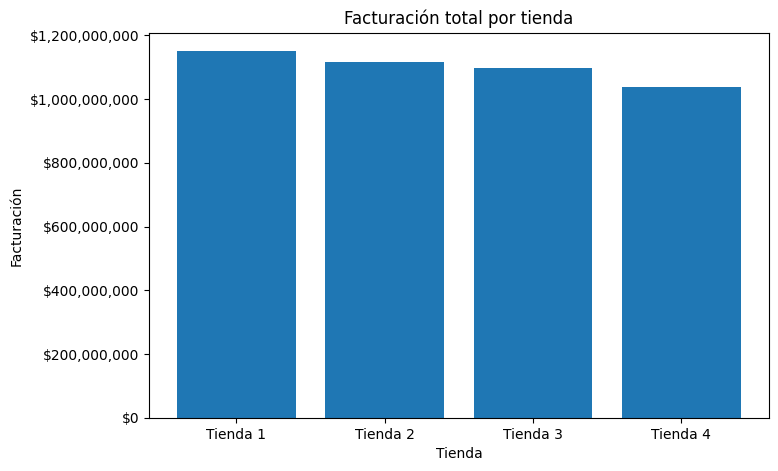

In [13]:
plt.figure(figsize=(8,5))
plt.bar(facturacion["Tienda"], facturacion["Facturación"])

plt.title("Facturación total por tienda")
plt.xlabel("Tienda")
plt.ylabel("Facturación")

# Formato para ver millones
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, p: f"${x:,.0f}"))

plt.show()



# 2. Ventas por categoría

Ventas Tienda 1

In [65]:
tienda["Categoría del Producto"].value_counts()


,count
Categoría del Producto,
Muebles,465
Electrónicos,448
Juguetes,324
Electrodomésticos,312
Deportes y diversión,284
Instrumentos musicales,182
Libros,173
Artículos para el hogar,171


Ventas Tienda 2

In [66]:
tienda2["Categoría del Producto"].value_counts()

,count
Categoría del Producto,
Muebles,442
Electrónicos,422
Juguetes,313
Electrodomésticos,305
Deportes y diversión,275
Instrumentos musicales,224
Libros,197
Artículos para el hogar,181


Ventas Tienda 3

In [67]:
tienda3["Categoría del Producto"].value_counts()

,count
Categoría del Producto,
Muebles,499
Electrónicos,451
Juguetes,315
Electrodomésticos,278
Deportes y diversión,277
Libros,185
Instrumentos musicales,177
Artículos para el hogar,177


Ventas Tienda 4

In [68]:
tienda4["Categoría del Producto"].value_counts()

,count
Categoría del Producto,
Muebles,480
Electrónicos,451
Juguetes,338
Deportes y diversión,277
Electrodomésticos,254
Artículos para el hogar,201
Libros,187
Instrumentos musicales,170


Gráfico Ventas por Categoría

In [69]:
cat1 = tienda["Categoría del Producto"].value_counts()
cat2 = tienda2["Categoría del Producto"].value_counts()
cat3 = tienda3["Categoría del Producto"].value_counts()
cat4 = tienda4["Categoría del Producto"].value_counts()

categorias = pd.DataFrame({
    "Tienda 1": cat1,
    "Tienda 2": cat2,
    "Tienda 3": cat3,
    "Tienda 4": cat4
    }).fillna(0)

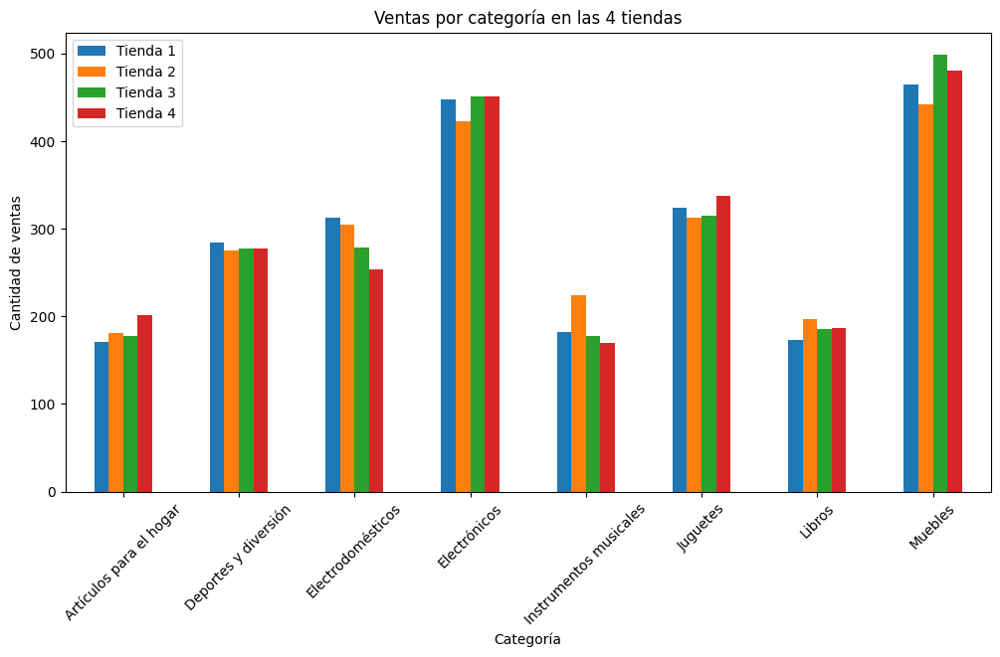

In [70]:
categorias.plot(kind="bar", figsize=(12,6))
plt.title("Ventas por categoría en las 4 tiendas")
plt.xlabel("Categoría")
plt.ylabel("Cantidad de ventas")
plt.xticks(rotation=45)
plt.show()

# 3. Calificación promedio de la tienda


In [28]:
cal_t1 = tienda["Calificación"].mean()
cal_t2 = tienda2["Calificación"].mean()
cal_t3 = tienda3["Calificación"].mean()
cal_t4 = tienda4["Calificación"].mean()

cal_t1, cal_t2, cal_t3, cal_t4


(np.float64(3.976685036032217),
 np.float64(4.037303942348453),
 np.float64(4.048325561678677),
 np.float64(3.9957591178965224))

In [29]:
calificaciones = pd.DataFrame({
    "Tienda": ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"],
    "Calificación promedio": [cal_t1, cal_t2, cal_t3, cal_t4]
})

calificaciones

,Tienda,Calificación promedio
0,Tienda 1,3.976685
1,Tienda 2,4.037304
2,Tienda 3,4.048326
3,Tienda 4,3.995759


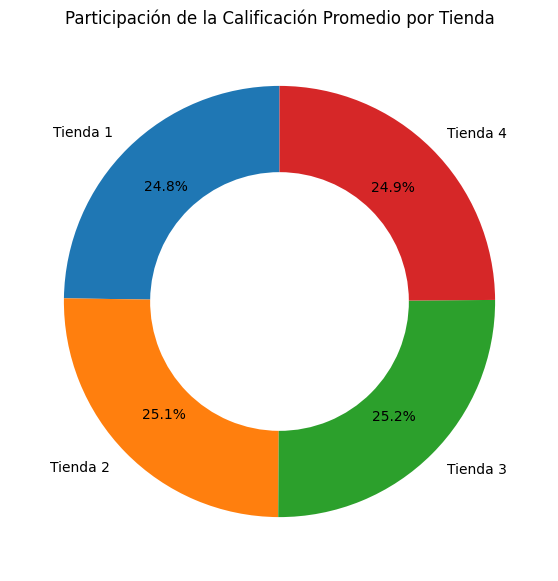

In [59]:
calif_t1 = tienda['Calificación'].mean()
calif_t2 = tienda2['Calificación'].mean()
calif_t3 = tienda3['Calificación'].mean()
calif_t4 = tienda4['Calificación'].mean()

calificaciones = [calif_t1, calif_t2, calif_t3, calif_t4]
tiendas = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

plt.figure(figsize=(7,7))

plt.pie(
    calificaciones,
    labels=tiendas,
    autopct='%1.1f%%',
    startangle=90,
    pctdistance=0.75,
    wedgeprops=dict(width=0.4)
)

plt.title('Participación de la Calificación Promedio por Tienda')
plt.show()


# 4. Productos más y menos vendidos

Resultados Tienda 1

In [32]:
mas_vendido_t1 = tienda["Producto"].value_counts().idxmax()
menos_vendido_t1 = tienda["Producto"].value_counts().idxmin()

mas_vendido_t1, menos_vendido_t1


('Microondas', 'Auriculares con micrófono')

Resultados Tienda 2

In [33]:
mas_vendido_t2 = tienda2["Producto"].value_counts().idxmax()
menos_vendido_t2 = tienda2["Producto"].value_counts().idxmin()

mas_vendido_t2, menos_vendido_t2


('Iniciando en programación', 'Juego de mesa')

Resultados Tienda 3

In [34]:
mas_vendido_t3 = tienda3["Producto"].value_counts().idxmax()
menos_vendido_t3 = tienda3["Producto"].value_counts().idxmin()

mas_vendido_t3, menos_vendido_t3


('Kit de bancas', 'Bloques de construcción')

Resultados Tienda 4

In [35]:
mas_vendido_t4 = tienda4["Producto"].value_counts().idxmax()
menos_vendido_t4 = tienda4["Producto"].value_counts().idxmin()

mas_vendido_t4, menos_vendido_t4


('Cama box', 'Guitarra eléctrica')

In [52]:
tiendas = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

mas_vendidos = [60, 65, 55, 62]
menos_vendidos = [32, 33, 35, 34]

productos_mas = [
    'Microondas',
    'Iniciando en programación',
    'Kit de bancas',
    'Cama box'
]

productos_menos = [
    'Auriculares con micrófono',
    'Juego de mesa',
    'Bloques de construcción',
    'Guitarra eléctrica'
]

Gráfico

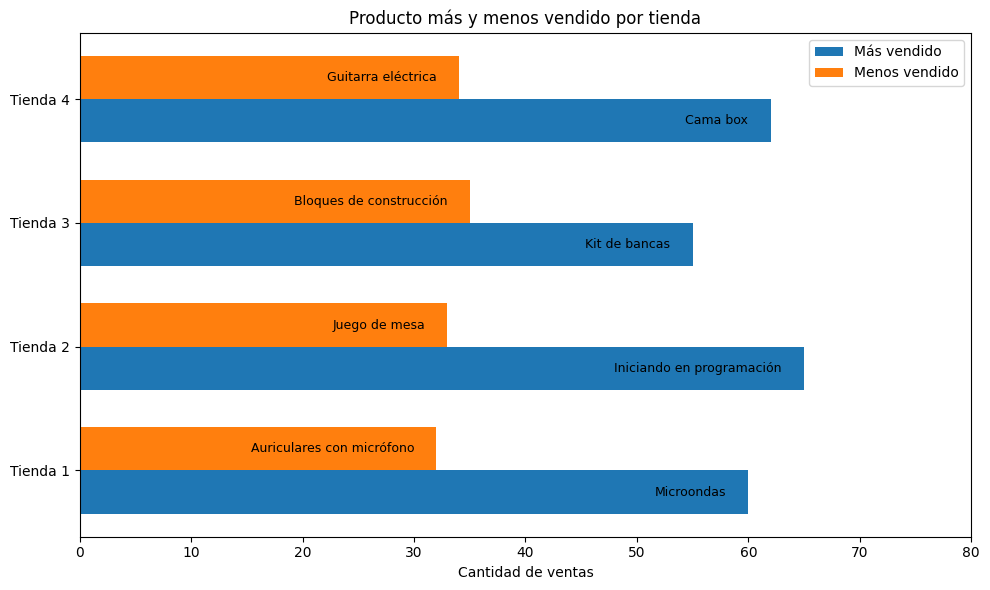

In [53]:
import numpy as np
y = np.arange(len(tiendas))
ancho = 0.35

plt.figure(figsize=(10,6))

plt.barh(y - ancho/2, mas_vendidos, height=ancho, label='Más vendido')
plt.barh(y + ancho/2, menos_vendidos, height=ancho, label='Menos vendido')

plt.yticks(y, tiendas)
plt.xlabel('Cantidad de ventas')
plt.title('Producto más y menos vendido por tienda')
plt.legend()

max_val = max(max(mas_vendidos), max(menos_vendidos))
plt.xlim(0, max_val + 15)

for i in range(len(tiendas)):
    plt.text(mas_vendidos[i] - 2, i - ancho/2, productos_mas[i],
             va='center', ha='right', fontsize=9)

    plt.text(menos_vendidos[i] - 2, i + ancho/2, productos_menos[i],
             va='center', ha='right', fontsize=9)

plt.tight_layout()
plt.show()

# 5. Envío promedio por tienda

In [56]:
# Promedio de costo de envío por tienda
envio_t1 = tienda['Costo de envío'].mean()
envio_t2 = tienda2['Costo de envío'].mean()
envio_t3 = tienda3['Costo de envío'].mean()
envio_t4 = tienda4['Costo de envío'].mean()

envios = [envio_t1, envio_t2, envio_t3, envio_t4]
tiendas = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']


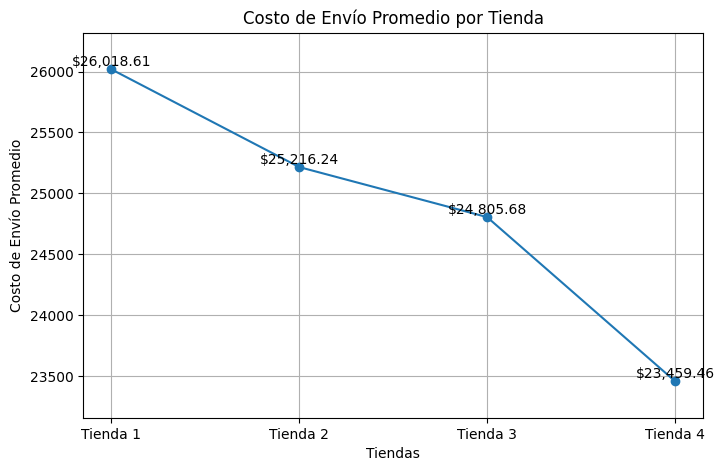

In [61]:
plt.figure(figsize=(8,5))

plt.plot(tiendas, envios, marker='o')

for i, valor in enumerate(envios):
    plt.text(i, valor, f"${valor:,.2f}", ha='center', va='bottom')

plt.ylim(min(envios) - 300, max(envios) + 300)

plt.title("Costo de Envío Promedio por Tienda")
plt.xlabel("Tiendas")
plt.ylabel("Costo de Envío Promedio")
plt.grid(True)
plt.show()



# **INFORME FINAL**

### INTRODUCCIÓN

El objetivo de este análisis fue evaluar el desempeño de las cuatro tiendas de la cadena Alura Store para ayudar al Sr. Juan a tomar una decisión estratégica sobre cuál tienda debería vender para invertir en un nuevo negocio.
Para ello se analizaron indicadores clave como la facturación, las categorías de productos, la satisfacción de los clientes, el comportamiento de ventas y el costo de envío.

### DESARROLLO DEL ANÁLISIS

Facturación total

Se compararon las ventas totales de las cuatro tiendas. Una de ellas presentó ingresos más bajos que las demás, lo que indica un menor rendimiento comercial.


---



Ventas por categoría


Al analizar las ventas por categoría, se observó que no todas las categorías se comportan igual entre las tiendas.
Aunque la tienda con menor facturación total tiene algunas categorías donde vende volúmenes similares o incluso ligeramente superiores a otras tiendas, en el total acumulado su rendimiento es menor, lo que explica su facturación más baja.

Esto indica que no es una tienda completamente ineficiente, pero sí una que no logra convertir esas ventas en ingresos suficientes, ya sea por precios, mezcla de productos o menor volumen global.


---



Calificación promedio

Las valoraciones de los clientes reflejan la calidad percibida del servicio y los productos. La tienda con peor desempeño tiene una calificación promedio más baja, lo que indica menor satisfacción del cliente.



---



Productos más y menos vendidos

Las tiendas más fuertes cuentan con productos que destacan por su alto volumen de ventas. En cambio, la tienda más débil no tiene productos que impulsen sus ingresos y varios de sus artículos están entre los menos vendidos.



---



Costo de envío promedio

El costo de envío es importante porque lo paga el cliente. La tienda con menor rendimiento tiene un costo de envío relativamente alto en comparación con sus ventas, lo que la hace menos atractiva para los compradores.



---





### CONCLUSIÓN Y RECOMENDACIÓN

Con base en todos los análisis y gráficos realizados, la tienda que el Sr. Juan debería vender es la ***Tienda 4.***

Esta tienda:

Tiene la menor facturación total

Presenta menor satisfacción del cliente

No cuenta con productos estrella que impulsen las ventas

No ofrece una ventaja clara en costos de envío

Aunque tiene algunas categorías con ventas aceptables, su rendimiento global es inferior al de las demás, por lo que representa la opción más lógica para vender y liberar capital para un nuevo emprendimiento más rentable.

---



En cuanto a las ***recomendaciones***:


*   Revisar los costos de envío : Se pueden negociar o reducir para mejorar productividad de las tiendas.
*   Mejorar la experiencia del cliente: Brindar mejor atención, menores tiempos de entrega, calidad de los productos especialmente en las tiendas que fueron menor calificadas.



# ANÁLISIS DEL DESEMPEÑO GEOGRÁFICO

## Mapa de Dispersión por Tienda

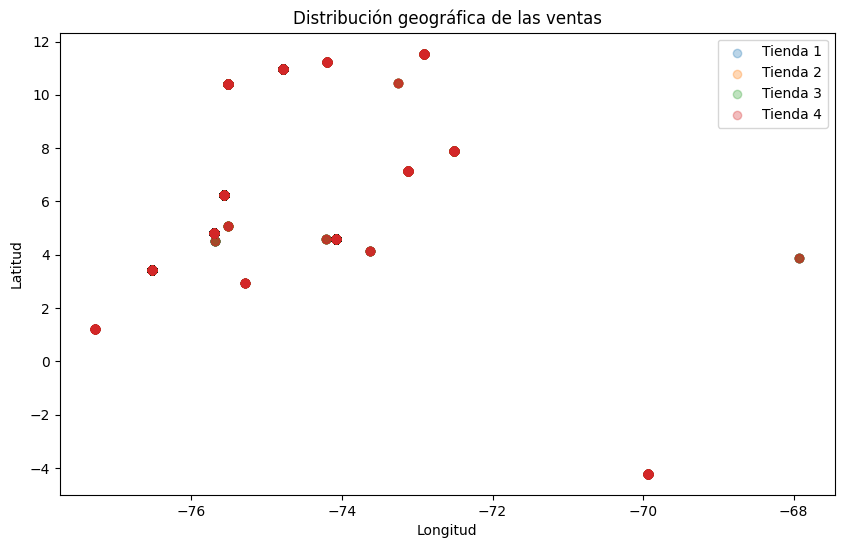

In [75]:
plt.figure(figsize=(10,6))

plt.scatter(tienda['lon'], tienda['lat'], alpha=0.3, label='Tienda 1')
plt.scatter(tienda2['lon'], tienda2['lat'], alpha=0.3, label='Tienda 2')
plt.scatter(tienda3['lon'], tienda3['lat'], alpha=0.3, label='Tienda 3')
plt.scatter(tienda4['lon'], tienda4['lat'], alpha=0.3, label='Tienda 4')

plt.title("Distribución geográfica de las ventas")
plt.xlabel("Longitud")
plt.ylabel("Latitud")
plt.legend()
plt.show()


In [86]:
# Tienda 1
for _, row in tienda.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        fill=True,
        popup="Tienda 1"
    ).add_to(mapa)

# Tienda 2
for _, row in tienda2.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        fill=True,
        popup="Tienda 2"
    ).add_to(mapa)

# Tienda 3
for _, row in tienda3.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        fill=True,
        popup="Tienda 3"
    ).add_to(mapa)

# Tienda 4
for _, row in tienda4.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        fill=True,
        popup="Tienda 4"
    ).add_to(mapa)

mapa
